![Memories Teach](https://lh3.google.com/u/2/d/11o4JyBYhHcmz-LSt63GpOs4lfW9j39T_=w1912-h954-iv1)


`Basic to Advance in Google colab's for image processing, pattern recognition and computer vision`

[Phonepaserth SISAYKEO]

Reference: visioncolab

# True Black-Box Explanation in Facial Analysis
*Domingo Mery*


ABSTRACT.- *When explaining a recognition approach that can be
used in facial analysis, e.g. face verification, face detection,
attribute recognition, etc., the task is to answer: how relevant are the parts of a given image to establish the recognition. In many cases, however, the trained models cannot
be manipulated and must be treated as “black-boxes”. In
this paper, we present a saliency map methodology, called
MinPlus, that can be used to explain any facial analysis
approach with no manipulation inside of the recognition
model, because it only needs the input-output function of
the black-box ‘fx’. The key idea of the method is based
on how the probability of recognition of the given image
changes when it is perturbed. Our method removes and
aggregates different parts of the image, and measures contributions of these parts individually and in-collaboration
as well. We test and compare our method in four different
scenarios: face verification (with ArcFace), face expression
recognition (with Xception), face detection (with MTCNN)
and masked face detection (with YOLOv5s). We conclude
that MinPlus achieves saliency maps that are stable and
interpretable to humans. In addition, our method shows
promising results in comparison with other state-of-the-art
methods like AVG, LIME and RISE. This paper presents
good insights into any facial analysis approach. It can be
used to highlight the most relevant areas that an algorithm
takes into account to carry out the recognition process.*

Reference:

Mery, D. (2022): [True Black-Box Explanation in Facial Analysis](https://openaccess.thecvf.com/content/CVPR2022W/Biometrics/papers/Mery_True_Black-Box_Explanation_in_Facial_Analysis_CVPRW_2022_paper.pdf), IEEE Computer Society Workshop on Biometrics in conjunction with CVPR2022.



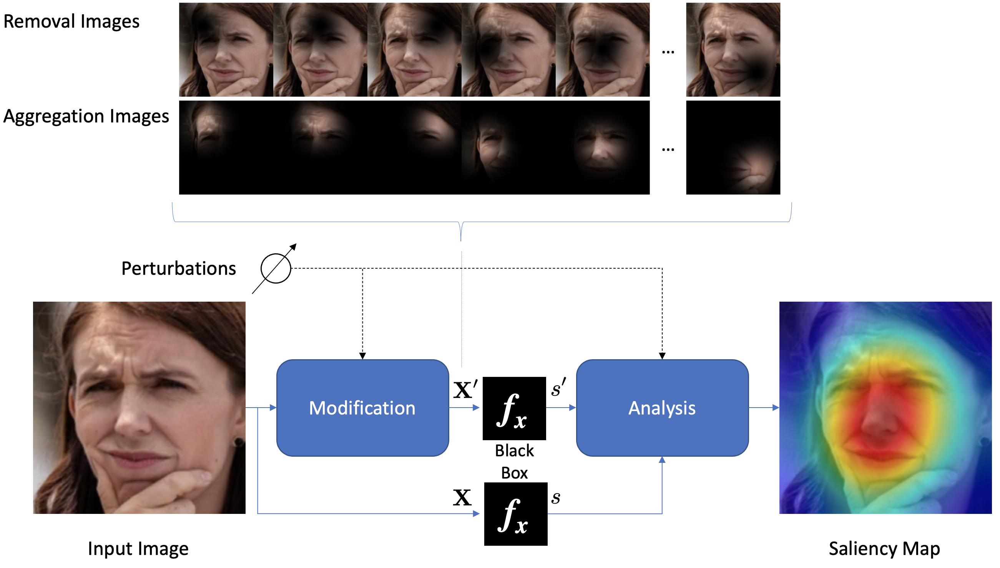

# STEP 0: Setup

## Testing Images

In [ ]:
!wget https://www.dropbox.com/s/z53wj55m3djeovf/minplus_images.zip
!unzip -qq minplus_images.zip

--2023-07-20 15:36:21--  https://www.dropbox.com/s/z53wj55m3djeovf/minplus_images.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.64.18, 2620:100:6031:18::a27d:5112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.64.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/z53wj55m3djeovf/minplus_images.zip [following]
--2023-07-20 15:36:22--  https://www.dropbox.com/s/raw/z53wj55m3djeovf/minplus_images.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucc36f8f9d2a50f96a725d8ef9a3.dl.dropboxusercontent.com/cd/0/inline/CAPpck1JiKayAo5Co78ZBQLDaNTLRjWUFmf_h_JsZid_uFnryWlloxaQCgKfy_ATW100391OhhUitaPFyzngiOB-7kQrENct6jSMW9UwVcC22kL02Lp0aEIH3GBLsAitYOYLfNdE-pu_HqkGbCF-j118dXuDB-cIIiQuExh526kXxw/file# [following]
--2023-07-20 15:36:23--  https://ucc36f8f9d2a50f96a725d8ef9a3.dl.dropboxusercontent.com/cd/0/inline/CAPpck1JiKayAo5Co78ZBQLDaNTLRjWUFmf_h_JsZid_uFnryWlloxaQCgK

In [ ]:
fpath_in  = '/content/minplus_images/'
print('Following images are available in folder '+fpath_in+':')
!ls $fpath_in

Following images are available in folder /content/minplus_images/:
arturo.jpg	   FER_009_3.png  FER_044_0.png  jacinda_D.png
arturo_vidal.jpg   FER_010_2.png  FER_045_6.png  jacinda_E.png
arturo_vidal.png   FER_011_0.png  FER_046_2.png  jacinda_F.png
faceA_blend.png    FER_012_6.png  FER_047_3.png  jacinda_G.png
faceA_mask.png	   FER_013_6.png  FER_048_6.png  jacinda_H.png
faceA_p002.png	   FER_014_6.png  FER_049_2.png  merkel_A.png
faceA_p003.png	   FER_015_3.png  FER_050_2.png  merkel_B.png
faceA_p004.png	   FER_016_5.png  FER_051_2.png  merkel_C.png
faceA_p005.png	   FER_017_3.png  FER_052_5.png  merkel_D.png
faceA_p006.png	   FER_018_2.png  FER_053_5.png  merkel_E.png
faceA_p007.png	   FER_019_6.png  FER_054_6.png  merkel_F.png
faceA_p008.png	   FER_020_4.png  FER_055_4.png  merkel_G.png
faceA_p009.png	   FER_021_4.png  FER_056_5.png  merkel_H.png
faceA_p010.png	   FER_022_2.png  FER_057_0.png  merkel_I.png
faceA_pirate2.png  FER_023_0.png  FER_058_3.png  merkel_J.png
faceA_pirate.

## Standard libraries

In [ ]:
import numpy as np
import cv2

## MinPlus Library

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from   tqdm import tqdm
import time
import random
import skimage.io
import skimage.segmentation
import copy
import sklearn
import sklearn.metrics
from   sklearn.linear_model import LinearRegression

# MISCELANEOUS
def num2fixstr(x,d):
    st = '%0*d' % (d,x)
    return st
def str2(x):
    return "{:.2f}".format(x)
def str4(x):
    return "{:.4f}".format(x)

# INPUT OUTPUT FUNCTIONS
def read_img(img_path):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (256,256))
    return img

def imshow(I,height=6,width=None,show_pause=0,title=None,fpath=None):
  n = height
  if width!=None:
    m = width
  else:
    N = I.shape[0]
    M = I.shape[1]
    m = round(n*M/N)
  __,ax = plt.subplots(1,1,figsize=(m,n))
  bw = len(I.shape)==2
  if bw:
     ax.imshow(I)
  else:
     ax.imshow(cv2.cvtColor(I, cv2.COLOR_BGR2RGB))
  if title!=None:
    ax.set_title(title)
  plt.axis('off')
  if fpath!=None:
     plt.savefig (fpath,bbox_inches = 'tight',pad_inches = 0)
  if show_pause>0:
    plt.pause(show_pause)
    plt.close()
  else:
    plt.show()


def contours(D,A,color_map,contour_levels,print_levels=False,color_levels=True):
    # D: heatmap
    # A: background image
    # Examples
    # contours(D,A,'jet'  ,10,print_levels=False,color_levels=True,img_file='Cont.png')
    # contours(D,A,'white',10,print_levels=True,color_levels=False,img_file=None)
    height    = D.shape[0]
    width     = D.shape[1]
    levels    = np.linspace(0.1, 1.0, contour_levels)
    x         = np.arange(0, width, 1)
    y         = np.arange(0, height, 1)
    extent    = (x.min(), x.max(), y.min(), y.max())

    Z = D/D.max()
    At = cv2.cvtColor(A, cv2.COLOR_BGR2RGB)
    plt.figure()
    plt.imshow(At,extent=extent)
    if color_levels:
      CS = plt.contour(Z, levels, cmap=color_map, origin='upper', extent=extent)
    else:
      CS = plt.contour(Z, levels, colors=color_map, origin='upper', extent=extent)

    if print_levels:
      plt.clabel(CS,fontsize=9, inline=1)
    plt.axis('off')
    plt.savefig ('Contour.png',bbox_inches = 'tight',pad_inches = 0)
    # plt.show()
    plt.clf()
    plt.close()
    C = cv2.imread('Contour.png')
    C = cv2.resize(C,(width,height))
    return C


## IMAGE PROCESSING
def gaussian_kernel(size, sigma, type='Sum'):
    x, y = np.mgrid[-size // 2 + 1:size // 2 + 1,
           -size // 2 + 1:size // 2 + 1]
    kernel = np.exp(-((x ** 2 + y ** 2) / (2.0 * sigma ** 2)))
    if type=='Sum':
      kernel = kernel / kernel.sum()
    else:
      kernel = kernel / kernel.max()
    return kernel.astype('double')

def DefineGaussianMask(ic,jc,nh,N=256,M=256):
  # Define an image of NxM, with a Gaussian of nh x nh centred in (ic,jc)
  nh2 = round(nh/2)
  i1  = ic
  j1  = jc
  n   = N+nh
  m   = M+nh
  s   = nh/8.5
  h   = 1-gaussian_kernel(nh,s,type='Max')
  Mk  = np.ones((n,m))
  i2  = i1+nh
  j2  = j1+nh
  Mk[i1:i2,j1:j2] = h
  return Mk[nh2:nh2+N,nh2:nh2+M]

def MaskMult(A,Mk):
    n = Mk.shape[0]
    m = Mk.shape[1]
    M = np.zeros((n,m,3))
    M[:,:,0] = Mk
    M[:,:,1] = Mk
    M[:,:,2] = Mk
    Ak = np.multiply(M,A)
    return Ak.astype(np.uint8)

def MaskMultNeg(BB,Bo,Mk):
    B1 = MaskMult(Bo,1-Mk)
    Bn = (255-B1)/255
    Bk = 255 - np.multiply(BB,Bn)
    return Bk.astype(np.uint8)

def heatmap(Ao,H,ss,alpha=0.5,type='Max'):
    hm = gaussian_kernel(ss,ss/8.5,type='Max')
    X  = cv2.filter2D(H,-1,hm)
    D = X-np.min(X)
    if type=='Max':
        #D = minmax_norm(X)
        D = D/np.max(D)
    else:
        D = D/np.sum(D)
    X  = np.uint8(D*255)
    HM = cv2.applyColorMap(X, cv2.COLORMAP_JET)
    Y  = cv2.addWeighted(HM, alpha, Ao, 1-alpha, 0)
    return D,Y

# MINUS FUNCTIONS
def removing_score(A,fx_score,d,nh,ROI=None,background=1.0):
  N      = A.shape[0]
  M      = A.shape[1]
  Hsc    = background*np.ones((N,M))
  sc_min = 10
  sc_max = -10
  if ROI is None:
      ROI = np.ones((N,M,3))
  for ic in range(d,N,d):
    for jc in range(d,M,d):
      if np.sum(ROI[ic,jc,:])>0:
        Mk  = DefineGaussianMask(ic,jc,nh)
        Ak  = MaskMult(A,Mk)
        sc = fx_score(Ak)
        Hsc[ic,jc] = sc
        if sc<sc_min:
            sc_min  = sc
            out_min = [Ak,sc_min,ic,jc]
        if sc>sc_max:
            sc_max  = sc
            out_max = [Ak,sc_max,ic,jc]
  return Hsc,out_min,out_max

def saliency_minus(A,fx_score,nh,d,n,nmod,th):
    N    = A.shape[0]
    M    = A.shape[1]
    H1   = np.zeros((N,M))
    sc0 = fx_score(A)
    st   = "{:7.4f}".format(sc0)
    print('minus t = 000 sc[0]='+st)
    imshow(A,show_pause=1,title='sc0 = '+st)
    t    = 0
    sct  = sc0
    At   = A
    dsc  = 1
    t0   = time.time()
    while sct>th and t<n:
        t = t+1
        Hsc,out_min,__ = removing_score(At,fx_score,d,nh,ROI=At,background=sc0)
        if t==1:
            H0 = sc0-Hsc
        sct     = out_min[1]       # minimal score by removing a gaussian mask centered in (i,j)
        i       = out_min[2]
        j       = out_min[3]
        sct_st  = "{:7.4f}".format(sct)
        dsc     = sc0-sct
        H1[i,j] = dsc
        sc0 = sct
        hij_st = "{:.4f}".format(H1[i,j])
        t1 = time.time()
        dt_st = "{:.2f}".format(t1-t0)
        t0     = t1
        print('minus t = '+num2fixstr(t,3)+' sc[t]='+sct_st+ ' H[' + num2fixstr(i,3)+ ',' +num2fixstr(j,3) + '] = sc[t-1]-sc[t] = '+hij_st+' > '+dt_st+'s')
        At      = out_min[0]
        if np.mod(t,nmod)==0:
            imshow(At,show_pause=1)
    return H0,H1

# PLUS FUNCTIONS
def adding_score(A,Ao,fx_score,d,nh,ROI=None,background=1.0):

  N      = A.shape[0]
  M      = A.shape[1]
  nh2    = round(nh/2)
  sc_max = -10
  sc_min = 10
  AA     = 255-A
  Hsc    = np.zeros((N,M))
  if ROI is None:
      ROI = np.ones((N,M,3))
  for ic in range(d,N,d):
    for jc in range(d,M,d):
      if np.sum(ROI[ic,jc,:])>0:
        Mk = DefineGaussianMask(ic,jc,nh)
        Ak = MaskMultNeg(AA,Ao,Mk)
        sc  = fx_score(Ak)
        Hsc[ic,jc] = sc
        if sc<sc_min:
           sc_min  = sc
           out_min = [Ak,sc_min,ic,jc]
        if sc>sc_max:
           sc_max  = sc
           out_max = [Ak,sc_max,ic,jc]
  return Hsc,out_min,out_max

def add_best(A,Ao,fx_score,d,nh):
  Hsc,__,out_max = adding_score(A,Ao,fx_score,d,nh)
  Aks = out_max[0]
  output = out_max[1:]
  return Aks,Hsc,output

def saliency_plus(A,fx_score,nh,d,n,nmod,th):
    N    = A.shape[0]
    M    = A.shape[1]
    At   = np.random.rand(N,M,3)*2
    At   = At.astype(np.uint8)
    H1   = np.zeros((N,M))
    scA  = fx_score(A)
    sc0  = fx_score(At)
    st   = "{:7.4f}".format(sc0)
    print('plus  t = 000 sc[0]='+st)
    imshow(At,show_pause=1)
    sct  = sc0
    t    = 0
    dsc  = 1
    t0   = time.time()
    while t<n and (scA-sct)>th:
        t = t+1
        At,Hsc,out_max = add_best(At,A,fx_score,d,nh)
        sct = out_max[0]
        if t==1:
            H0 = Hsc-sc0
        i       = out_max[1]
        j       = out_max[2]
        sct_st  = "{:7.4f}".format(sct)
        dsc     = sct-sc0
        H1[i,j] = dsc
        sc0     = sct
        hij_st  = "{:.4f}".format(H1[i,j])
        t1 = time.time()
        dt_st = "{:.2f}".format(t1-t0)
        t0     = t1
        print('plus  t = '+num2fixstr(t,3)+' sc[t]='+sct_st+ ' H[' + num2fixstr(i,3)+ ',' +num2fixstr(j,3) + '] = sc[t]-sc[t-1] = '+hij_st+' > '+dt_st+'s')
        if np.mod(t,nmod)==0:
            imshow(At,show_pause=1)
    return H0,H1

def randomints(i1,i2,n):
  randomlist = []
  i2 = i2-1
  for i in range(n):
    x = random.randint(i1,i2)
    randomlist.append(x)
  return randomlist

def DefineRISEmasks(k,N,M,smin,smax,kernel='Gauss'):
  height = 2*N
  width  = 2*M
  ii = randomints(0, height, k)
  jj = randomints(0, width, k)
  ss = randomints(smin,smax,k)
  Mk  = np.ones((height,width))
  for t in range(len(ii)):
      i1 = ii[t]
      j1 = jj[t]
      s = 1.0*ss[t]
      if kernel=='Gauss':
         h  = 1-gaussian_kernel(s,s/8.5,type='Max')
      else:
         h = 1.0*np.zeros((ss[t],ss[t]))
      n = h.shape[0]
      i2 = i1+n
      j2 = j1+n
      if i2>height:
        i2 = height
      if j2>width:
        j2 = width
      Mk[i1:i2,j1:j2] = np.multiply(Mk[i1:i2,j1:j2],h[0:i2-i1,0:j2-j1])

  i1 = round(N/2)
  j1 = round(M/2)
  if kernel=='Square':
    Mks = cv2.resize(Mk,(32,32))
    Mk  = cv2.resize(Mks,(height,width))
  return Mk[i1:i1+N,j1:j1+M]

def saliency_RISE(A,fx_score,n,k,smin,smax,kernel='Gauss'):
    N      = A.shape[0]
    M      = A.shape[1]
    #xA     = fattribute(A)
    S      = np.zeros((N,M))
    sc_max = 10
    for t in tqdm(range(n)):
      Mk  = 1-DefineRISEmasks(k,N,M,smin,smax,kernel=kernel)
      At  = MaskMult(A,Mk)
      #xAt = fattribute(At)
      #sc  = xAt[kexp]
      sc  = fx_score(At)
      S   = S+sc*Mk
      if sc<sc_max:
        sc_max = sc
    print('sc_min=',sc)
    S = S/n
    return S


def perturbations(n,m,p=0.5):
    perts = np.random.binomial(1, p, size=(n,m))
    return perts

def perturb_image(img,perturbation,segments):
    active_pixels = np.where(perturbation == 1)[0]
    mask = np.zeros(segments.shape)
    for active in active_pixels:
        mask[segments == active] = 1
    perturbed_image = copy.deepcopy(img)
    X = perturbed_image*mask[:,:,np.newaxis]
    X = X.astype(np.uint8)
    return X,mask

def color_mask(X,M,col):
    Y = copy.deepcopy(X)
    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            if M[i,j]==0:
                Y[i,j,:]=col
    return Y

def show_superpixels(B,superpixels):
    Bs = skimage.segmentation.mark_boundaries(B, superpixels)
    Bs = Bs*255
    Bs = Bs.astype(np.uint8)
    return Bs

def saliency_LIME(A,fx_score,N=500,num_top_features=16,kernel_size=3,max_dist=200, ratio=0.2):
    #xA          = fattribute(A)
    #sc          = xA[kexp]
    sc          = fx_score(A)
    print('score = '+str4(sc))
    superpixels = skimage.segmentation.quickshift(A, kernel_size=kernel_size,max_dist=max_dist, ratio=ratio)
    m           = np.unique(superpixels).shape[0]
    perts       = perturbations(N,m)
    Y = A
    imshow(Y)
    scores = []
    s = np.zeros((A.shape[0],A.shape[1]))
    for i in tqdm(range(N)):
        At,Mt = perturb_image(A,perts[i],superpixels)
        #xA    = fattribute(At)
        #sc    = xA[kexp]
        sc    = fx_score(At)
        s     = s + sc*Mt
        scores.append(sc)
    s = s/N
    predictions = np.array(scores)
    original_image = np.ones(m)[np.newaxis,:] #Perturbation with all superpixels enabled
    distances      = sklearn.metrics.pairwise_distances(perts,original_image, metric='cosine').ravel()
    kernel_width   = 0.25
    weights        = np.sqrt(np.exp(-(distances**2)/kernel_width**2)) #Kernel function
    simpler_model  = LinearRegression()
    simpler_model.fit(X=perts, y=predictions, sample_weight=weights)
    coeff          = simpler_model.coef_
    ys             = simpler_model.predict(perts)
    err            = np.abs(ys-predictions)
    print('error = '+str4(np.mean(err)))
    top_features   = np.argsort(coeff)[-num_top_features:]
    mask = np.zeros(m)
    mask[top_features]= True #Activate top superpixels
    As,Ms = perturb_image(A,mask,superpixels)
    return As,Ms,s,superpixels



# STEP A: Choose one experiment (only one!)
<font color='orange'> $\rightarrow$ Run the cells for face verification, face detection or face expressions, and go to Step B.

## 1) Face Verification

In [ ]:
### FOR ARCFACE (IT DOESN'T WORK!!! > GO TO ADAFACE)
# 1) INSTALLATION OF THE LIBRARY
#!pip install arcface
#from arcface import ArcFace
#arcface    = ArcFace.ArcFace()

In [ ]:
# 2) MATCHING SCORE FUNCTION FOR FACE VERIFICATION
#def fx_face_matching(X):
  # y is the reference embedding
#  x = arcface.calc_emb(X)
#  score = np.dot(x,y)
#  return score

In [ ]:
### FOR ADA FACE
# 1) INSTALLATION OF THE LIBRARY
!git clone https://github.com/mk-minchul/AdaFace
!pip install gdown
!gdown https://drive.google.com/uc?id=1eUaSHG4pGlIZK7hBkqjyp2fc2epKoBvI
!mkdir /content/AdaFace/pretrained
!mv /content/adaface_ir50_ms1mv2.ckpt /content/AdaFace/pretrained/
!pip install pytorch-lightning

Cloning into 'AdaFace'...
remote: Enumerating objects: 233, done.
remote: Counting objects: 100% (86/86), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 233 (delta 56), reused 50 (delta 50), pack-reused 147
Receiving objects: 100% (233/233), 38.94 MiB | 16.14 MiB/s, done.
Resolving deltas: 100% (88/88), done.
Downloading...
From: https://drive.google.com/uc?id=1eUaSHG4pGlIZK7hBkqjyp2fc2epKoBvI
To: /content/adaface_ir50_ms1mv2.ckpt
100% 700M/700M [00:14<00:00, 47.9MB/s]
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 722.4/722.4 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 729.2/729.2 kB 55.0 MB/s eta 0:00:00


In [ ]:
%cd /content/AdaFace
from face_alignment import align
from inference import load_pretrained_model, to_input
model = load_pretrained_model('ir_50')

/content/AdaFace


In [ ]:
# 2) MATCHING SCORE FUNCTION FOR FACE VERIFICATION

from PIL import Image

def fx_adaface(X):
  img       = cv2.resize(X, (112,112))
  coverted  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  pil_image = Image.fromarray(coverted)
  bgr_input = to_input(pil_image)
  features, _ = model(bgr_input)
  x = features.detach()
  x = x.numpy()
  return x

def fx_face_matching(X):
  x = fx_adaface(X)
  score = np.dot(x,y.T)[0][0]
  return score


img_X     = fpath_in + 'merkel_B.png'
X         = read_img(img_X)
x         = fx_adaface(X)
img_Y     = fpath_in + 'merkel_A.png'
Y         = read_img(img_Y)
y         = fx_adaface(Y)

score = fx_face_matching(X)

print(score)



/content/AdaFace/inference.py:25: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  tensor = torch.tensor([brg_img.transpose(2,0,1)]).float()


0.6471705


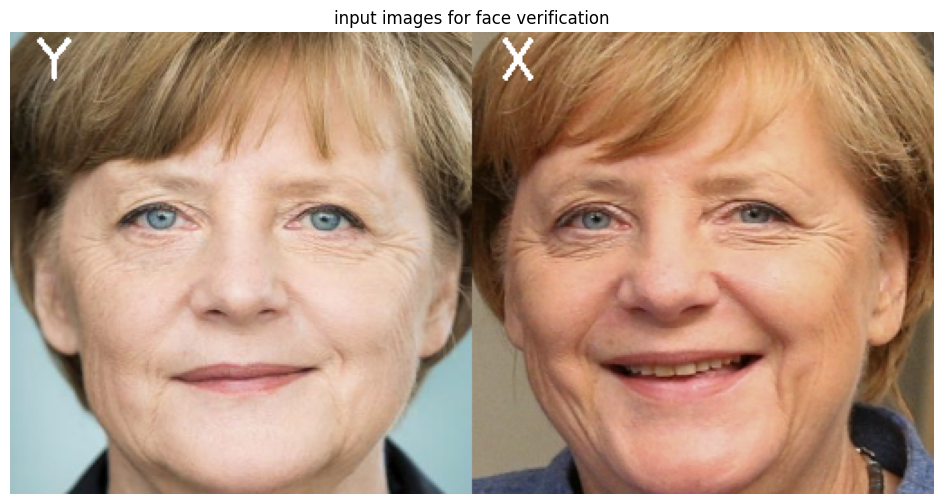

Face embedding of image Y is stored in variable y as referece.
score =  0.6471705


In [ ]:
# 3) INPUT IMAGES FOR FACE VERIFICATION
img_Y     = fpath_in + 'merkel_A.png'
img_X     = fpath_in + 'merkel_B.png'
pos       = (15,25)
Y         = read_img(img_Y)
X         = read_img(img_X)
(N,M)     = Y.shape[0:2]
Ys        = Y.copy()
Xs        = X.copy()
cv2.putText(Ys,'Y', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
cv2.putText(Xs,'X', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
Xin       = cv2.hconcat([Ys,Xs])


imshow(Xin,title='input images for face verification')
y = fx_adaface(Y)

print('Face embedding of image Y is stored in variable y as referece.')

sc = fx_face_matching(X)
print('score = ',sc)


In [ ]:
# 4) PARAMETERS OF MINPLUS

FAST_MODE = True

if FAST_MODE:  # 1 minute
  gsigma    = 221                # width of Gaussian mask
  d         = 48                 # steps (one evaluation each d x d pixeles)
  tmax      = 1                  # maximal number of iterations
else:          # 6 minutes
  gsigma    = 161                # width of Gaussian mask
  d         = 16                  # steps (one evaluation each d x d pixeles)
  tmax      = 20                 # maximal number of iterations
dsc         = 0.01
fx          = fx_face_matching

<font color='orange'> $\rightarrow$ GOTO STEP B

## 2) Face Detection

In [ ]:
# 1) INSTALLATION OF THE LIBRARY
!pip3 install mtcnn
!pip3 install opencv-contrib-python
from mtcnn.mtcnn import MTCNN
detector = MTCNN()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 53.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# 2) FACE DETECTION FUNCTION
def fx_facedetection(X):
  face_locations = detector.detect_faces(X)
  n = len(face_locations)
  sc = 0
  if n>0:
    for i in range(n):
      sci = face_locations[i]['confidence']
      if sci>sc:
        sc = sci
  return sc


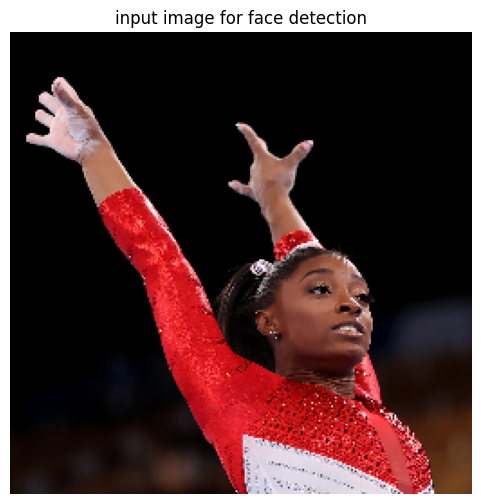

1/1 [==============================] - 0s 148ms/step
score =  0.9992


In [ ]:
# 3) INPUT IMAGE
img_path = fpath_in +'simone.png'
X = read_img(img_path)
Xin = X
imshow(Xin,title='input image for face detection')

fx = fx_facedetection

score = fx(X)

st   = "{:7.4f}".format(score)
print('score = '+st)

In [ ]:
# 4) PARAMETERS OF MINPLUS
tmax    = 20
dsc     = 0.05
d       = 20  # steps
gsigma  = 145 # gaussian mask

<font color='orange'> $\rightarrow$ GOTO STEP B

## 3) Face Expressions

In [ ]:
# 1) INSTALLATION OF THE LIBRARY
from keras.preprocessing.image import img_to_array
from keras.models import load_model
!wget https://www.dropbox.com/s/dvi08d0hodkp2fw/_mini_XCEPTION.106-0.65.hdf5
expression_model_path = '_mini_XCEPTION.106-0.65.hdf5'
expression_classifier = load_model(expression_model_path, compile=False)
expression_name       = ["angry","disgust","scared", "happy", "sad", "surprised","neutral"]

--2022-06-16 16:26:46--  https://www.dropbox.com/s/dvi08d0hodkp2fw/_mini_XCEPTION.106-0.65.hdf5
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:601d:18::a27d:512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/dvi08d0hodkp2fw/_mini_XCEPTION.106-0.65.hdf5 [following]
--2022-06-16 16:26:46--  https://www.dropbox.com/s/raw/dvi08d0hodkp2fw/_mini_XCEPTION.106-0.65.hdf5
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucfb0be186859f95ab8da0195730.dl.dropboxusercontent.com/cd/0/inline/BnUxWisD0hZl4PPgKPyjyOCFv1rghrSy3gR2AHrp0G6Ez8_O_Qv_5Q3H2dtjr0KRHrm5HRpbAJrL8Q7Bw9Zi_Sgbx6VDSl_VE9-gULDUT5CEOlXbeWU6Lua71GwQ4glqI9pbEQ7Uh0BZaPlnnQ2FpPPWOtKwAC0xomRpXnQRzRtJlQ/file# [following]
--2022-06-16 16:26:47--  https://ucfb0be186859f95ab8da0195730.dl.dropboxusercontent.com/cd/0/inline/BnUxWisD0hZl4PPgKPyj

In [ ]:
# 2) FACE EXPRESSION FUNCTION
def fx_expressions(X):
  Xg = cv2.cvtColor(X, cv2.COLOR_BGR2GRAY)
  roi = cv2.resize(Xg, (48, 48))
  roi = roi.astype("float") / 255.0
  roi = img_to_array(roi)
  roi = np.expand_dims(roi, axis=0)
  expressions = expression_classifier.predict(roi)[0]
  return expressions

def fx_exp(X):
  expressions = fx_expressions(X)
  return expressions[kexp]

angry      =  0.0012
disgust    =  0.0000
scared     =  0.0168
happy      =  0.0803
sad        =  0.0202
surprised  =  0.0018
neutral    =  0.8797
dominant   =  neutral
Expression 6  0.8797


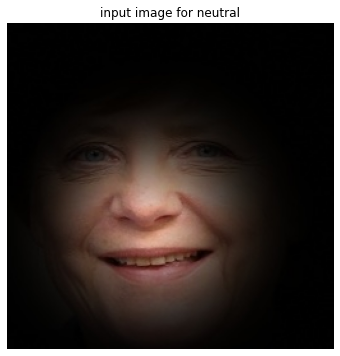

In [ ]:
# 3) INPUT IMAGE

#img_path = 'merkel_B.png'
#img_path = 'FER_041_0.png'
#img_path = 'FER_044_0.png'
img_path = 'B01_000143.jpg'

X = read_img(fpath_in + img_path)
expressions = fx_expressions(X)

for i in range(7):
  st   = "{:7.4f}".format(expressions[i])
  se   = "{:10s}".format(expression_name[i])
  print(se+' = '+st)

dominant = expression_name[np.argmax(expressions)]
print('========================')
print('dominant   = ',dominant)
kexp = np.argmax(expressions)
fexp = fx_exp(X)
st   = "{:7.4f}".format(fexp)

print('Expression '+str(kexp)+' '+st)
fx = fx_exp
Xin = X
imshow(Xin,title='input image for '+dominant)

<font color='orange'> $\rightarrow$ GOTO STEP B

In [ ]:
gg = [1,1,1]
def MaskMult(A,Mk):
    n = Mk.shape[0]
    m = Mk.shape[1]
    M = np.ones((n,m,3))
    O = np.ones((n,m))
    for i in range(3):
      if gg[i]:
         M[:,:,i] = Mk
    Ak = np.multiply(M,A)
    return Ak.astype(np.uint8)


<font color='orange'> $\rightarrow$ GOTO STEP B

# STEP B: Saliency Maps

## Minus

Algorithms 1 (${\bf H}_0^-$) and 2 (${\bf H}_1^-$) from:

Mery, D. (2022): [True Black-Box Explanation in Facial Analysis](https://openaccess.thecvf.com/content/CVPR2022W/Biometrics/papers/Mery_True_Black-Box_Explanation_in_Facial_Analysis_CVPRW_2022_paper.pdf), IEEE Computer Society Workshop on Biometrics in conjunction with CVPR2022.


minus t = 000 sc[0]= 0.6472


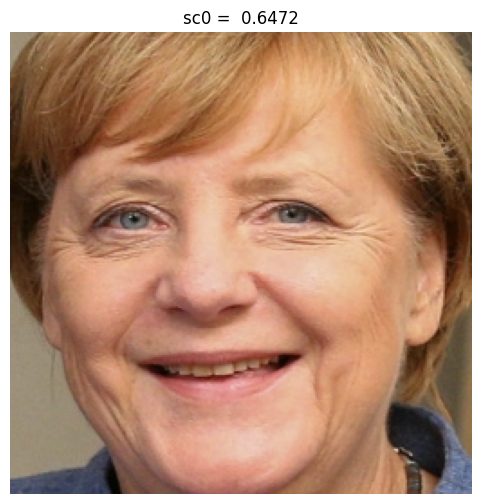

minus t = 001 sc[t]= 0.5242 H[096,096] = sc[t-1]-sc[t] = 0.1229 > 3.42s


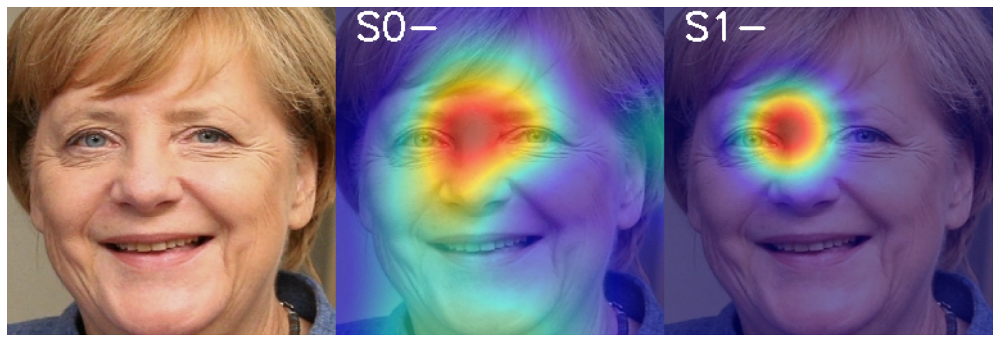

In [ ]:
H0m,H1m = saliency_minus(X,fx,nh=gsigma,d=d,n=tmax,nmod=2,th=dsc)
S0m,Y0m = heatmap(X,H0m,gsigma)
S1m,Y1m = heatmap(X,H1m,gsigma)
pos     = (15,25)
cv2.putText(Y0m,'S0-', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
cv2.putText(Y1m,'S1-', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
Im      = cv2.hconcat([X,Y0m,Y1m])
imshow(Im,fpath='heatmap_minus.png',show_pause=1)

## Plus

Algorithms 3 (${\bf H}_0^+$) and 4 (${\bf H}_1^+$) from:

Mery, D. (2022): [True Black-Box Explanation in Facial Analysis](https://openaccess.thecvf.com/content/CVPR2022W/Biometrics/papers/Mery_True_Black-Box_Explanation_in_Facial_Analysis_CVPRW_2022_paper.pdf), IEEE Computer Society Workshop on Biometrics in conjunction with CVPR2022.


plus  t = 000 sc[0]= 0.0484


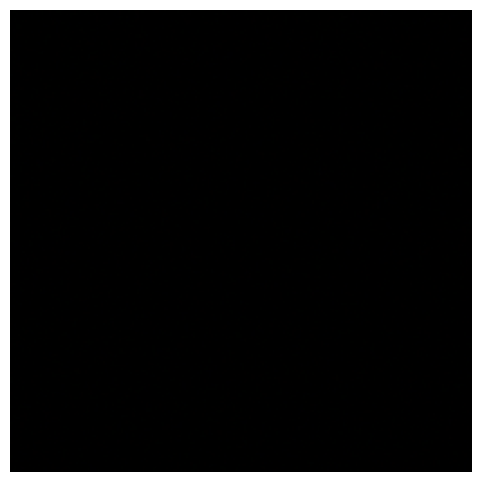

plus  t = 001 sc[t]= 0.2269 H[096,096] = sc[t]-sc[t-1] = 0.1785 > 3.24s


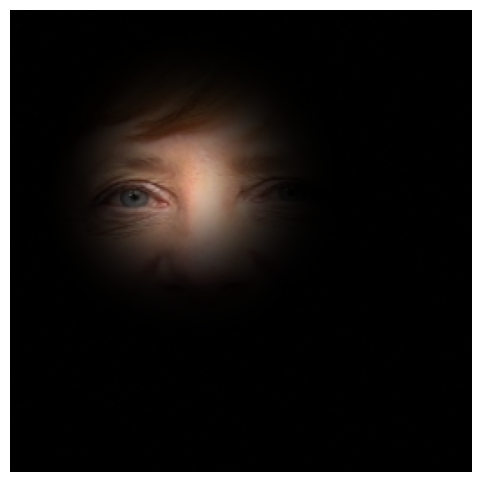

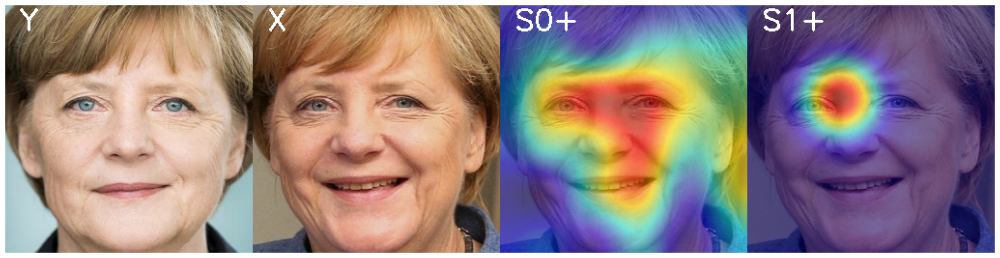

In [ ]:
H0p,H1p   = saliency_plus(X,fx,nh=gsigma,d=d,n=tmax,nmod=1,th=dsc)
S0p,Y0p   = heatmap(X,H0p,gsigma)
S1p,Y1p   = heatmap(X,H1p,gsigma)
cv2.putText(Y0p,'S0+', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
cv2.putText(Y1p,'S1+', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
Ip        = cv2.hconcat([Xin,Y0p,Y1p])
imshow(Ip,fpath='heatmap_plus.png',show_pause=1)


## MinPlus

Proposed algorithm of:

Mery, D. (2022): [True Black-Box Explanation in Facial Analysis](https://openaccess.thecvf.com/content/CVPR2022W/Biometrics/papers/Mery_True_Black-Box_Explanation_in_Facial_Analysis_CVPRW_2022_paper.pdf), IEEE Computer Society Workshop on Biometrics in conjunction with CVPR2022.


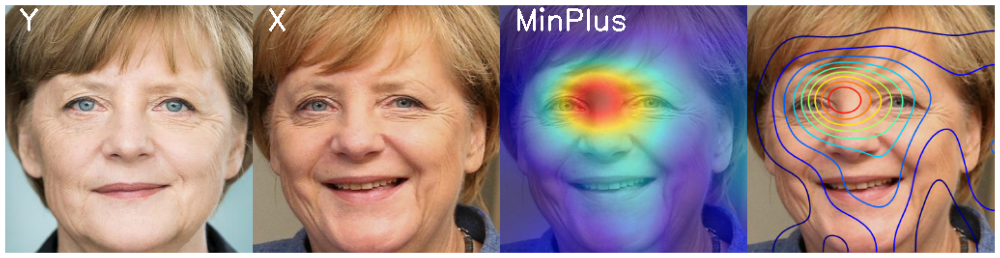

In [ ]:
#------------------------------------------------------
# WARNING: Run saliency-minus and saliency-plus before
#------------------------------------------------------

Havg      = (H0m+H0p+H1m+H1p)/4 # <= HeatMap between 0 and 1
Smp,Ymp   = heatmap(X,Havg,gsigma)
cv2.putText(Ymp,'MinPlus', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
C         = contours(255*Smp,X,'jet',10,print_levels=False,color_levels=True)
Imp       = cv2.hconcat([Xin,Ymp,C])
imshow(Imp,fpath='heatmap_MinPlus.png',show_pause=1)


## AVG

Mery, D.; Morris, B. (2022): [On Black-Box Explanation of Face Verification](https://github.com/domingomery/vision/blob/master/clases/Cap03_DeepLearning/papers/2022-BlackBoxExplanationFaceVerification.pdf), Winter Conference on Applications of Computer Vision (WACV2022)

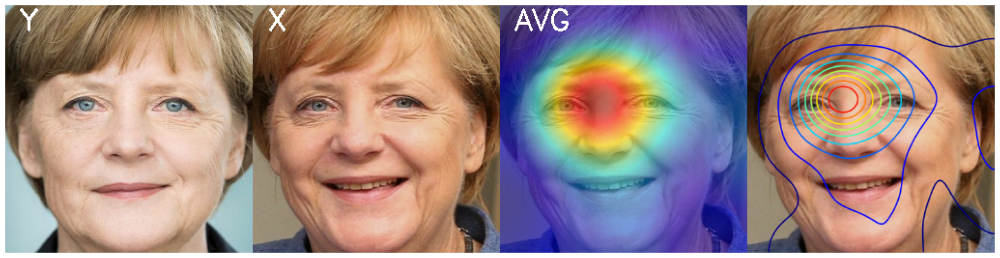

In [ ]:
#------------------------------------------------------
# WARNING: Run saliency-minus and saliency-plus before
#------------------------------------------------------

Savg      = (S0m+S0p+S1m+S1p)/4 # <= HeatMap between 0 and 1
_,Yavg    = heatmap(X,Savg,gsigma)
cv2.putText(Yavg,'AVG', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
C         = contours(255*Savg,X,'jet',10,print_levels=False,color_levels=True)
Iavg      = cv2.hconcat([Xin,Yavg,C])

imshow(Iavg,fpath='heatmap_AVG.png',show_pause=1)


## RISE

Vitali Petsiuk, Abir Das, and Kate Saenko. [RisE: Randomized input sampling for explanation of black-box models](https://arxiv.org/pdf/1806.07421.pdf). British Machine Vision Conference 2018, BMVC 2018, 1, 2019.


100%|██████████| 1000/1000 [03:56<00:00,  4.23it/s]


sc_min= 0.49292833


100%|██████████| 1000/1000 [02:32<00:00,  6.56it/s]


sc_min= 0.29279217


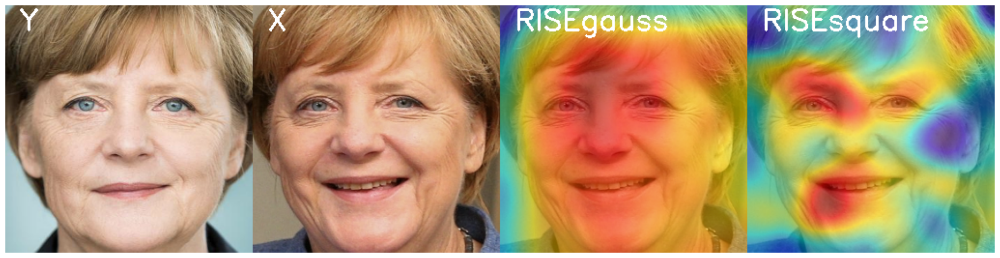

In [ ]:
Nrise = 1000 # number of simulated masks
Krise = 150  # number of gaussian/square regions in each mask
#smin       # minimal size in pixels of each region
#smax       # maximal size in pixels of each region

S = saliency_RISE(X,fx,Nrise,Krise,smin=60,smax=250,kernel='Gauss')
_,Ygauss = heatmap(X,S,99)
cv2.putText(Ygauss,'RISEgauss', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)

S = saliency_RISE(X,fx,Nrise,Krise,smin=20,smax=80,kernel='Square')
_,Ysquare = heatmap(X,S,99)
cv2.putText(Ysquare,'RISEsquare', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)

Irise = cv2.hconcat([Xin,Ygauss,Ysquare])
imshow(Irise,fpath='heatmap_RISE.png')

## LIME

Marco Tulio Ribeiro, Sameer Singh, and Carlos Guestrin. [”Why should I trust you?” Explaining the predictions of any classifier](https://arxiv.org/pdf/1602.04938.pdf). Proceedings of the ACM SIGKDD International Conference on Knowledge Discovery and Data Mining, 13- 17-Augu:1135–1144, 2016

score = 0.6472


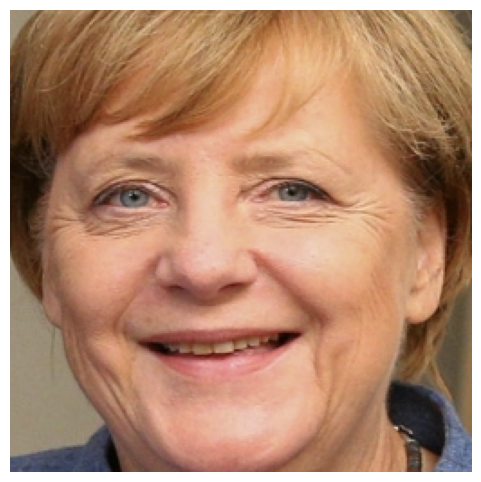

100%|██████████| 500/500 [01:16<00:00,  6.56it/s]


error = 0.0426


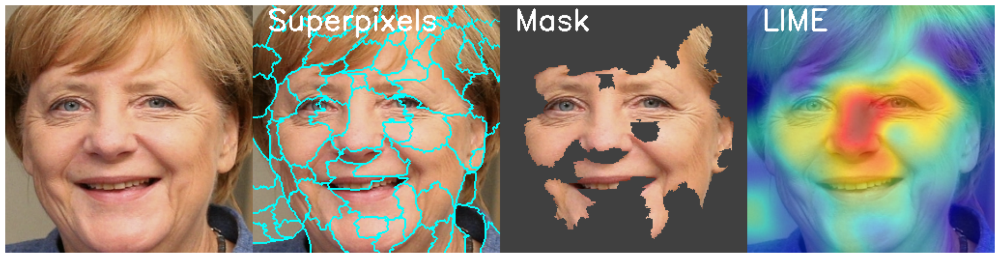

In [ ]:
Xsp,Ms,Z,superpixels = saliency_LIME(X,fx)
D1,Ylime = heatmap(X,Z,97)
Xk = color_mask(X,Ms,[64,64,64])
Xss = show_superpixels(X,superpixels)
cv2.putText(Xss,'Superpixels', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
cv2.putText(Xk,'Mask', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
cv2.putText(Ylime,'LIME', pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
Ilime = cv2.hconcat([X,Xss,Xk,Ylime])
imshow(Ilime,fpath='heatmap_LIME.png')

## Comparisons

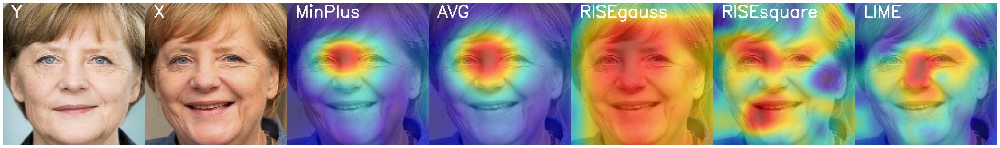

In [ ]:
Iall       = cv2.hconcat([Xin,Ymp,Yavg,Ygauss,Ysquare,Ylime])
imshow(Iall,fpath='heatmap_all.png',show_pause=1)